<span style="color: red;">Requirement when running in Goolge Colab</span>

In [ ]:
!pip install diffusers

# Smoothed Energy Guidance
This is a simple Jupyter notebook implementation for Smoothed Eneregy Guidance based of this paper https://arxiv.org/pdf/2408.00760. A portion of the code is extracted from the official implementation https://github.com/SusungHong/SEG-SDXL which is done for Stable Diffusion XL and this notebook covers the relevant explanation, implementation and results for Stable Diffusion 2.1 base instead.

It demonstrates how Smoothed Energy Guidance (SEG) can significantly improve the results of unconditional and conditional based sampling both for Vanilla and Classifer Free Guidance (CFG) sampling.


# Hopefiled networks

The author of the paper points out that the attention mechanism can be interpreted through an energy-based perspective, closely related to modern Hopfield networks. The attention operation is framed as a minimisation step on an energy landscape, with the softmax function acting as the first derivative. This approach is remarkably close to the actual attention calculation, where the energy function penalizes misalignment and regularizes the attention weights, effectively shaping the landscape in a way that mirrors the attention process itself.

In [2]:
import warnings
warnings.filterwarnings("ignore")
from diffusers import StableDiffusionPipeline
import torch
import matplotlib.pyplot as plt
from typing import Optional
from tqdm import tqdm
import math
import torch.nn.functional as F
from diffusers import DDIMScheduler

model_id = "stabilityai/stable-diffusion-2-1-base"

pipe = StableDiffusionPipeline.from_pretrained(model_id)
pipe = pipe.to("cuda")

scheduler = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

# Gaussian Blur is All You Need

The author aims to theoretically derive the effect of applying Gaussian blur to attention weights, showing that it attenuates the curvature of the underlying energy function. This insight leads to the development of attention-based diffusion guidance, which enhances sample quality, even in the absence of explicit conditions like CFG. By blurring attention weights, the curvature of the energy landscape is reduced, resulting in smoother guidance predictions, which are formally defined as Smoothed Energy Guidance (SEG).

This part of the code implements a simple Gaussian Blur function:

In [3]:
def gaussian_blur_2d(img, kernel_size, sigma):
    height = img.shape[-1]
    kernel_size = min(kernel_size, height - (height % 2 - 1))
    ksize_half = (kernel_size - 1) * 0.5

    x = torch.linspace(-ksize_half, ksize_half, steps=kernel_size)

    pdf = torch.exp(-0.5 * (x / sigma).pow(2))

    x_kernel = pdf / pdf.sum()
    x_kernel = x_kernel.to(device=img.device, dtype=img.dtype)

    kernel2d = torch.mm(x_kernel[:, None], x_kernel[None, :])
    kernel2d = kernel2d.expand(img.shape[-3], 1, kernel2d.shape[0], kernel2d.shape[1])

    padding = [kernel_size // 2, kernel_size // 2, kernel_size // 2, kernel_size // 2]
    img = F.pad(img, padding, mode="reflect")
    img = F.conv2d(img, kernel2d, groups=img.shape[-3])

    return img

# Attention Prcoess + SEG
Our empirical finding showed that the application of Gaussian Blur to the lowest dimensions of Mid (8x8), Upward (8x8, 16x16) and Downward (8x8, 16x16) attnetion blocks on self-attention query maps give the best results for Stable Diffusion 2.1


In [4]:
blur_inf = '∞'

def contextual_forward(self, blur_sigma = 0.0):

    self.blur_sigma = blur_sigma

    def forward_modified(
        hidden_states: torch.FloatTensor,
        encoder_hidden_states: Optional[torch.FloatTensor] = None,
        attention_mask: Optional[torch.FloatTensor] = None,
        temb: Optional[torch.FloatTensor] = None,
    ) -> torch.FloatTensor:
          
          dimension_squared = hidden_states.shape[1]

          is_cross = not encoder_hidden_states is None

          residual = hidden_states
          if self.spatial_norm is not None:
              hidden_states = self.spatial_norm(hidden_states, temb)

          input_ndim = hidden_states.ndim

          if input_ndim == 4:
              batch_size, channel, height, width = hidden_states.shape
              hidden_states = hidden_states.view(batch_size, channel, height * width).transpose(1, 2)

          batch_size, sequence_length, _ = (
              hidden_states.shape if encoder_hidden_states is None else encoder_hidden_states.shape
          )

          if attention_mask is not None:
              attention_mask = self.prepare_attention_mask(attention_mask, sequence_length, batch_size)
              # scaled_dot_product_attention expects attention_mask shape to be
              # (batch, heads, source_length, target_length)
              attention_mask = attention_mask.view(batch_size, self.heads, -1, attention_mask.shape[-1])

          if self.group_norm is not None:
              hidden_states = self.group_norm(hidden_states.transpose(1, 2)).transpose(1, 2)

          query = self.to_q(hidden_states)

          if encoder_hidden_states is None:
              encoder_hidden_states = hidden_states
          elif self.norm_cross:
              encoder_hidden_states = self.norm_encoder_hidden_states(encoder_hidden_states)

          key = self.to_k(encoder_hidden_states)
          value = self.to_v(encoder_hidden_states)

          inner_dim = key.shape[-1]
          head_dim = inner_dim // self.heads

          query = query.view(batch_size, -1, self.heads, head_dim).transpose(1, 2)

          key = key.view(batch_size, -1, self.heads, head_dim).transpose(1, 2)
          value = value.view(batch_size, -1, self.heads, head_dim).transpose(1, 2)

          height = width = math.isqrt(query.shape[2])
          

          if not is_cross and (self.blur_sigma == blur_inf or self.blur_sigma > 0):

            # based of empirical findings
            # 8x8 and 16x16
            allowed_res = [pipe.unet.config.sample_size // 4, pipe.unet.config.sample_size // 8]

            if (dimension_squared == allowed_res[0] * allowed_res[0] or dimension_squared == allowed_res[1] * allowed_res[1]):

                query_uncond, query_org, query_ptb = query.chunk(3)
                query_ptb = query_ptb.permute(0, 1, 3, 2).view(batch_size//3, self.heads * head_dim, height, width)

                if self.blur_sigma != blur_inf:
                    kernel_size = math.ceil(6 * self.blur_sigma) + 1 - math.ceil(6 * self.blur_sigma) % 2
                    query_ptb = gaussian_blur_2d(query_ptb, kernel_size, self.blur_sigma)
                else:
                    query_ptb[:] = query_ptb.mean(dim=(-2, -1), keepdim=True)

                query_ptb = query_ptb.view(batch_size//3, self.heads, head_dim, height * width).permute(0, 1, 3, 2)
                query = torch.cat((query_uncond, query_org, query_ptb), dim=0)



          hidden_states = F.scaled_dot_product_attention(
              query, key, value, attn_mask=attention_mask, dropout_p=0.0, is_causal=False,
          )

          hidden_states = hidden_states.transpose(1, 2).reshape(batch_size, -1, self.heads * head_dim)
          hidden_states = hidden_states.to(query.dtype)

          # linear proj
          hidden_states = self.to_out[0](hidden_states)
          # dropout
          hidden_states = self.to_out[1](hidden_states)

          if input_ndim == 4:
              hidden_states = hidden_states.transpose(-1, -2).reshape(batch_size, channel, height, width)

          if self.residual_connection:
              hidden_states = hidden_states + residual

          hidden_states = hidden_states / self.rescale_output_factor

          return hidden_states

    return forward_modified

In [5]:
def apply_seg(unet, child = None, blur_sigma=1.0):
    if child == None:
        children = unet.named_children()
        for child in children:
            apply_seg(unet, child[1], blur_sigma=blur_sigma)
    else:
        if child.__class__.__name__ == 'Attention':
            child.forward = contextual_forward(child, blur_sigma=blur_sigma)
        elif hasattr(child, 'children'):
            for sub_child in child.children():
                apply_seg(unet, sub_child, blur_sigma=blur_sigma)

# Utitly Functions

In [6]:
def display_image(image_meta_data):

  image, guidance_scale, blur_sigma = image_meta_data

  fig, ax = plt.subplots(figsize=(6, 6))
  fig.subplots_adjust(top=0.88)

  ax.imshow(image)
  ax.axis('off')

  fig.text(0.5, 0.9, f'$CFG = {guidance_scale}, \sigma = {blur_sigma}$', ha='center', va='center', fontsize=12)

  plt.show()

In [7]:
def display_images(image_meta_data_list, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows))
    fig.subplots_adjust(top=0.88, hspace=0.1, wspace=0.05)

    for i, (image, guidance_scale, blur_sigma) in enumerate(image_meta_data_list):
        row = i // cols
        col = i % cols

        ax = axes[row, col] if rows > 1 and cols > 1 else axes[i]
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(f'CFG = {guidance_scale}, σ = {blur_sigma}', fontsize=12)

    plt.show()


# Sampling Function

This is a wrapper for Stable Diffusion sampling steps with the inclusion of SEG alongside CFG. To reduce the complexity and extend of the code, all sampling will run with the same level of prompts overhead.

In [8]:
def sample(prompt, cfg = 7.5, blur_sigma = blur_inf, seed=123, steps=50, signal_scale = 1.0):

  guidance_scale = cfg
  num_inference_steps = steps
  scheduler.set_timesteps(num_inference_steps, device="cuda")
  timesteps = scheduler.timesteps

  shape = (1, pipe.unet.in_channels, pipe.unet.config.sample_size, pipe.unet.config.sample_size)
  latents = torch.randn(shape, generator=torch.Generator(device="cuda").manual_seed(seed), device="cuda").to("cuda")
  
  prompt_cond = pipe.encode_prompt(prompt=prompt, device="cuda", num_images_per_prompt=1, do_classifier_free_guidance=False)[0]
  prompt_uncond = pipe.encode_prompt(prompt="", device="cuda", num_images_per_prompt=1, do_classifier_free_guidance=False)[0]

  prompt_embeds_combined = torch.cat([prompt_uncond, prompt_cond, prompt_cond])

  with torch.no_grad():

      apply_seg(pipe.unet, blur_sigma=blur_sigma)

      for i, t in tqdm(enumerate(timesteps), total=len(timesteps), desc="Inference steps"):

        latent_model_input = torch.cat([latents] * 3)

        noise_pred = pipe.unet(
            latent_model_input,
            t,
            encoder_hidden_states=prompt_embeds_combined,
            cross_attention_kwargs=None,
            return_dict=False,
        )[0]


        noise_pred_uncond, noise_pred_cond, noise_pred_cond_perturb = noise_pred.chunk(3)

        
        # Classfier Free Guidance
        noise_cfg = noise_pred_uncond + guidance_scale * (noise_pred_cond - noise_pred_uncond)

        # Smoothed Energy Guidance
        noise_pred = noise_cfg + signal_scale * (noise_pred_cond - noise_pred_cond_perturb)

        latents = scheduler.step(noise_pred, t, latents, return_dict=False)[0]


      image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor, return_dict=False)[0]
      image_np = image.squeeze(0).float().permute(1, 2, 0).detach().cpu()
      image_np = (image_np / 2 + 0.5).clamp(0, 1)

      return (image_np, cfg, blur_sigma)

In [9]:
current_prompt = "A realistic photo of a woman, cyberpunk outfit, neon lighting, wall background"

# Single Sample:

Inference steps: 100%|██████████| 50/50 [00:18<00:00,  2.73it/s]


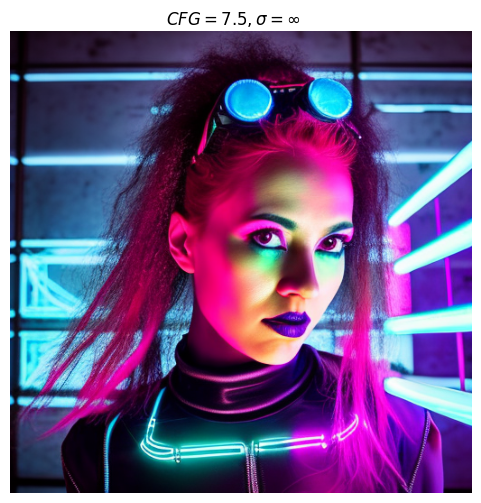

In [10]:
image_data = sample(current_prompt)
display_image(image_data)

# 10 Steps Results
Note: cfg = 0 relates to unconditional sampling

Inference steps: 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]


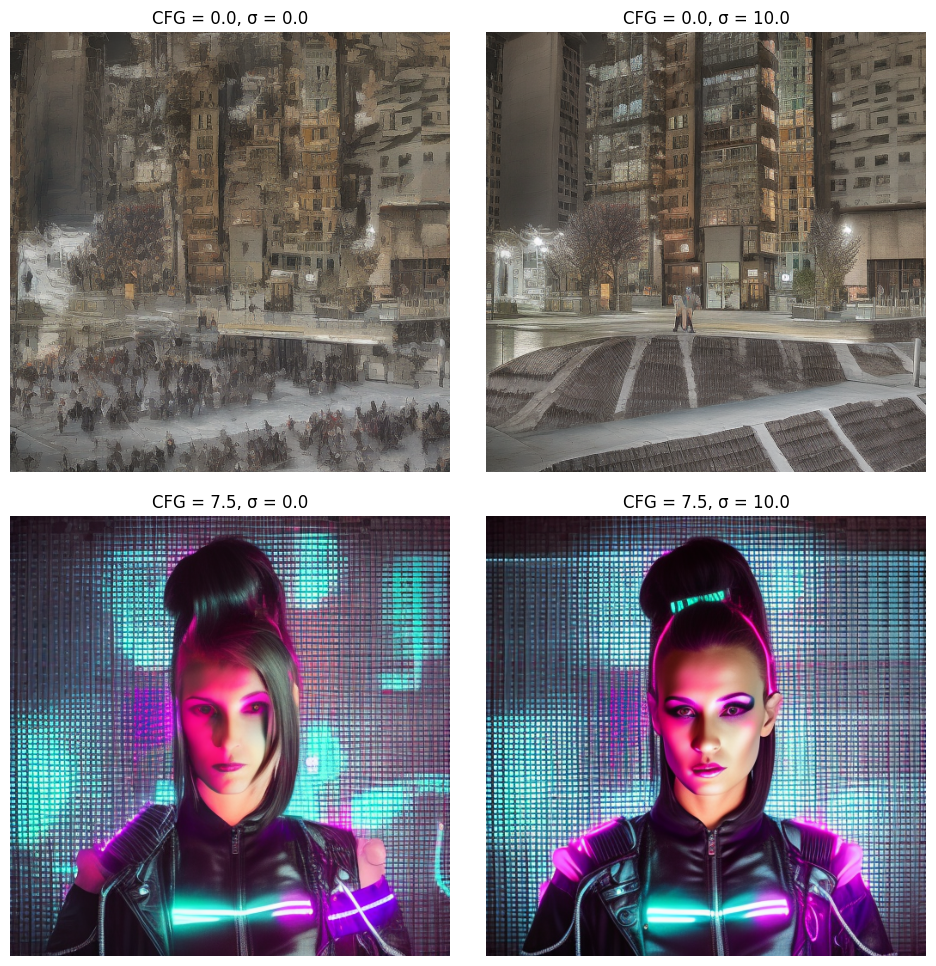

In [11]:
cfg = [0.0, 7.5]
blur_sigma = [0.0, 10.0]
data = []
for i in range(0, len(cfg)):
  for j in range(0, len(blur_sigma)):
    data.append(sample(current_prompt, cfg = cfg[i], blur_sigma = blur_sigma[j], steps=10, signal_scale=1.0))
display_images(data, rows=len(cfg), cols=len(blur_sigma))

Inference steps: 100%|██████████| 10/10 [00:03<00:00,  2.70it/s]


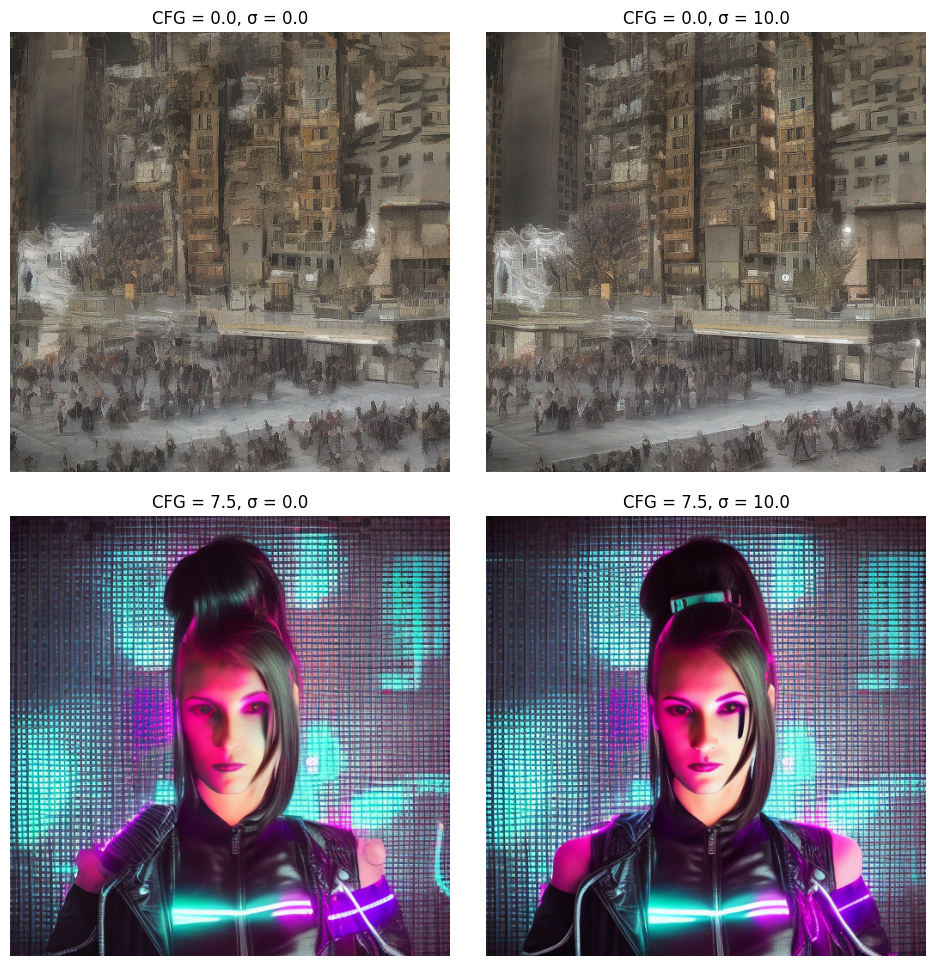

In [12]:
cfg = [0.0, 7.5]
blur_sigma = [0.0, 10.0]
data = []
for i in range(0, len(cfg)):
  for j in range(0, len(blur_sigma)):
    data.append(sample(current_prompt, cfg = cfg[i], blur_sigma = blur_sigma[j], steps=10, signal_scale=0.5))
display_images(data, rows=len(cfg), cols=len(blur_sigma))

# 50 Steps Results

Inference steps: 100%|██████████| 50/50 [00:18<00:00,  2.63it/s]


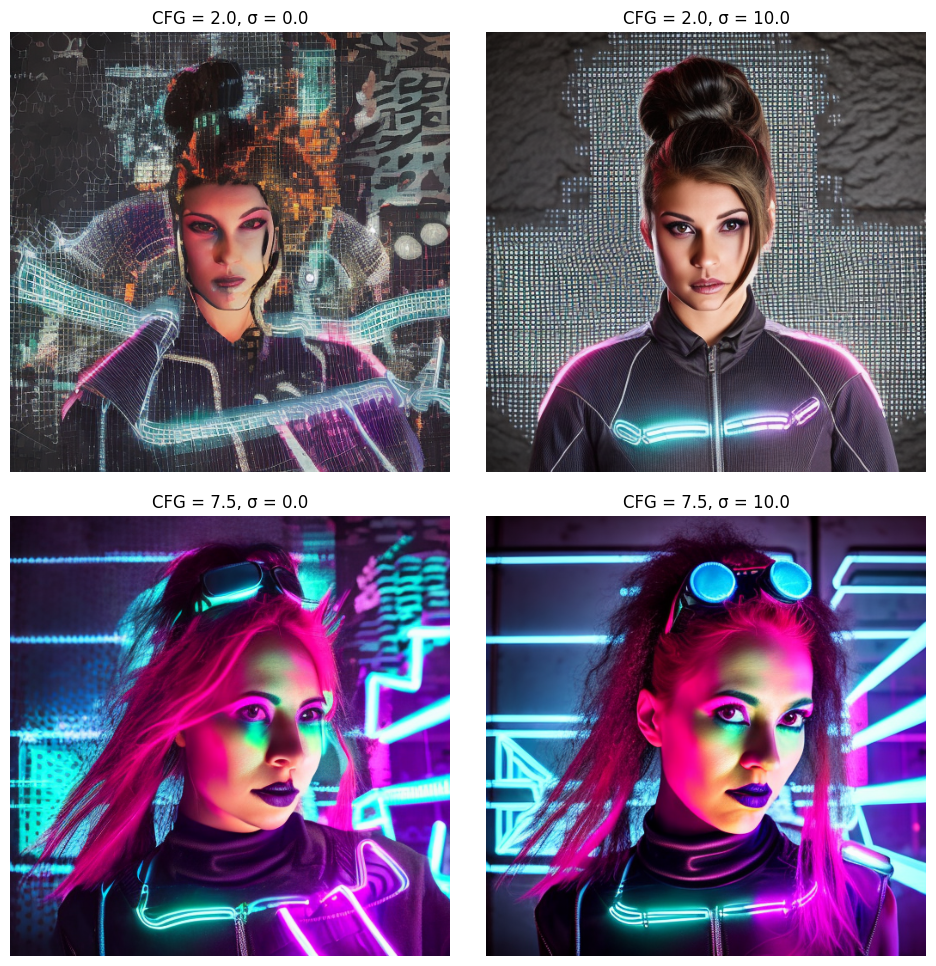

In [13]:
cfg = [2.0, 7.5]
blur_sigma = [0.0, 10.0]
data = []
for i in range(0, len(cfg)):
  for j in range(0, len(blur_sigma)):
    data.append(sample(current_prompt, cfg = cfg[i], blur_sigma = blur_sigma[j], signal_scale=1.0))
display_images(data, rows=len(cfg), cols=len(blur_sigma))

Inference steps: 100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


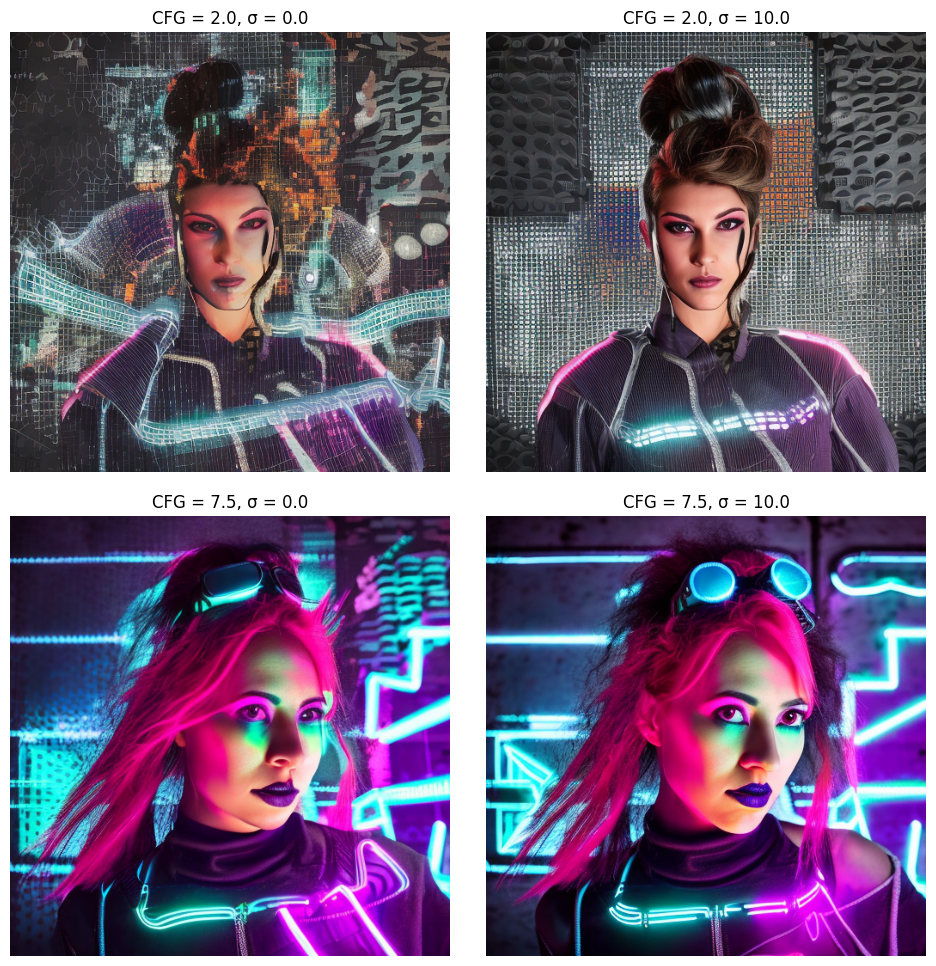

In [14]:
cfg = [2.0, 7.5]
blur_sigma = [0.0, 10.0]
data = []
for i in range(0, len(cfg)):
  for j in range(0, len(blur_sigma)):
    data.append(sample(current_prompt, cfg = cfg[i], blur_sigma = blur_sigma[j], signal_scale=0.5))
display_images(data, rows=len(cfg), cols=len(blur_sigma))

Inference steps: 100%|██████████| 50/50 [00:18<00:00,  2.65it/s]


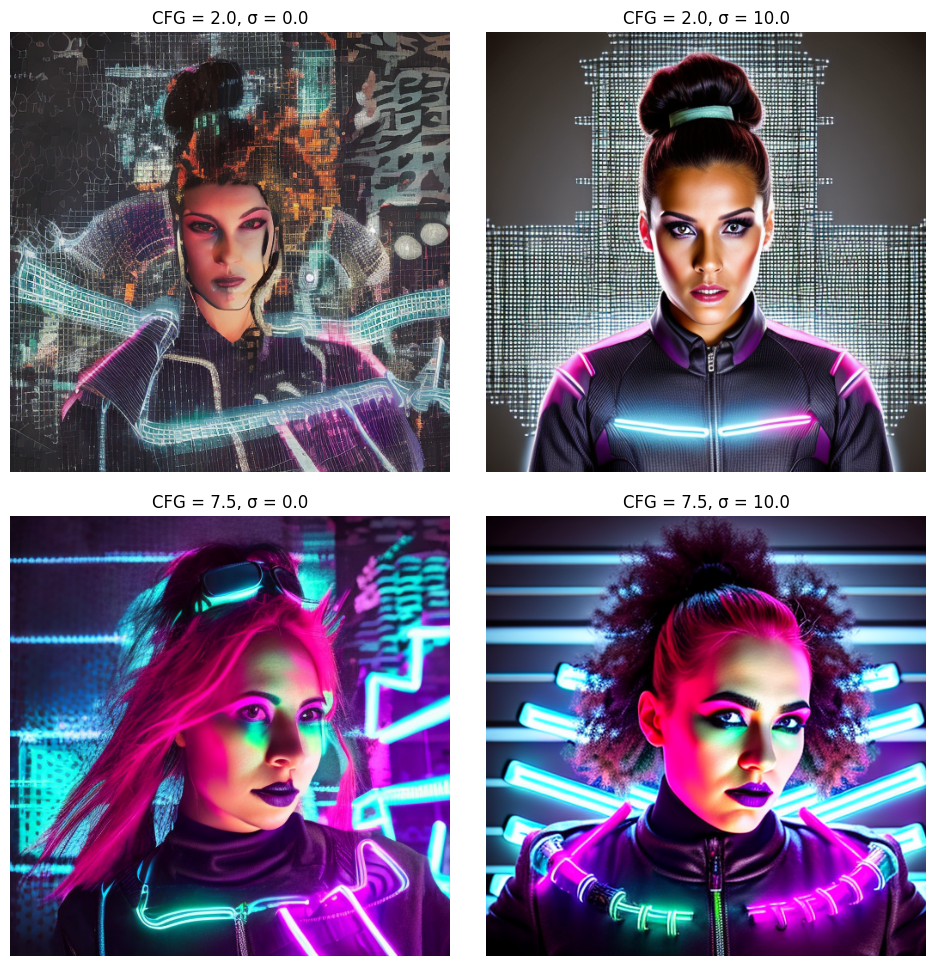

In [15]:
cfg = [2.0, 7.5]
blur_sigma = [0.0, 10.0]
data = []
for i in range(0, len(cfg)):
  for j in range(0, len(blur_sigma)):
    data.append(sample(current_prompt, cfg = cfg[i], blur_sigma = blur_sigma[j], signal_scale=2.0))
display_images(data, rows=len(cfg), cols=len(blur_sigma))